 Our data includes data of 100 engines, each doing their respective number of cycles as per their functional lifecycle.,
 During each cycle the sensors installed collects the data in each respective cycle.,
 Based on this collected data we need to build a model which would predict the remaining useful life,
 (RUL, time before which engine goes for maintenance to avoid unexpected breakdown)
 of a already/newly installed engine based on its current cycle data

Lets understand basic layout and working mechanism of a TURBOFAN JET ENGINE

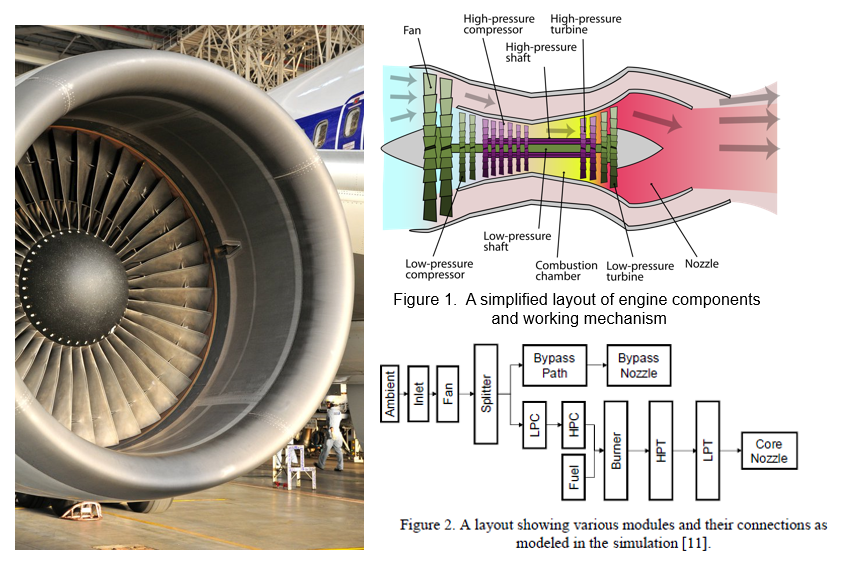

In [1]:
from PIL import Image 
from IPython.display import display
img = Image.open('final.png')
display(img)

In [2]:
#import libararies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
#Reading and importing data"
jet_data = pd.read_csv('train_FD001.txt', sep=" ", header=None)

In [4]:
jet_data.head()

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,NaN,NaN
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,NaN,NaN
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,NaN,NaN
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,NaN,NaN
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,NaN,NaN


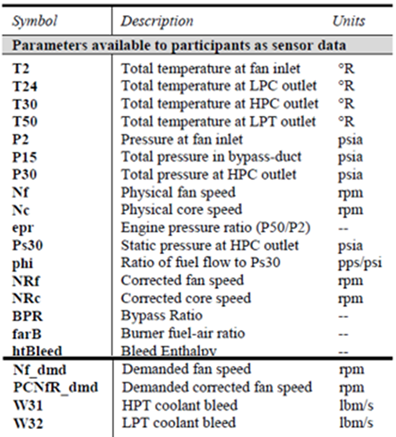

In [5]:
#find the sensor names as available in C-MAPSS setup
sensor = Image.open('sensor.png')
display(sensor)

In [6]:
#setting column names accordingly
jet_data.columns = ["Engine","cycle","setting1","setting2","setting3","Fan Inlet Temperature (◦R)",
"(LPC Outlet Temperature) (◦R)",
"(HPC Outlet Temperature) (◦R)",
"(LPT Outlet Temperature) (◦R)",
"(Fan Inlet Pressure) (psia)",
"(Bypass-Duct Pressure) (psia)",
"(HPC Outlet Pressure) (psia)",
"(Physical Fan Speed) (rpm)",
"(Physical Core Speed) (rpm)",
"(Engine Pressure Ratio(P50/P2)",
"(HPC Outlet Static Pressure) (psia)",
"(Ratio of Fuel Flow to Ps30) (pps/psia)",
"(Corrected Fan Speed) (rpm)",
"(Corrected Core Speed) (rpm)",
"(Bypass Ratio) ",
"(Burner Fuel-Air Ratio)",
"(Bleed Enthalpy)",
"(Required Fan Speed)",
"(Required Fan Conversion Speed)",
"(High-Pressure Turbines Cool Air Flow)",
"(Low-Pressure Turbines Cool Air Flow)",
"Sensor1",
"Sensor2"]

In [7]:
# Creating a new dataframe for maximum cycles of each engine
jet_id_and_rul = jet_data.groupby('Engine')['cycle'].max().reset_index()

In [8]:
#to make hidden rows and column visible
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500),
pd.set_option('display.width', 1000)

In [9]:
jet_data.head(500)

,Engine,cycle,setting1,setting2,setting3,Fan Inlet Temperature (◦R),(LPC Outlet Temperature) (◦R),(HPC Outlet Temperature) (◦R),(LPT Outlet Temperature) (◦R),(Fan Inlet Pressure) (psia),(Bypass-Duct Pressure) (psia),(HPC Outlet Pressure) (psia),(Physical Fan Speed) (rpm),(Physical Core Speed) (rpm),(Engine Pressure Ratio(P50/P2),(HPC Outlet Static Pressure) (psia),(Ratio of Fuel Flow to Ps30) (pps/psia),(Corrected Fan Speed) (rpm),(Corrected Core Speed) (rpm),(Bypass Ratio),(Burner Fuel-Air Ratio),(Bleed Enthalpy),(Required Fan Speed),(Required Fan Conversion Speed),(High-Pressure Turbines Cool Air Flow),(Low-Pressure Turbines Cool Air Flow),Sensor1,Sensor2
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,NaN,NaN
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,NaN,NaN
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,NaN,NaN
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,NaN,NaN
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,NaN,NaN
5,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,21.61,554.67,2388.02,9049.68,1.3,47.16,521.68,2388.03,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669,NaN,NaN
6,1,7,0.0010,0.0001,100.0,518.67,642.48,1592.32,1397.77,14.62,21.61,554.34,2388.02,9059.13,1.3,47.36,522.32,2388.03,8132.32,8.3974,0.03,392,2388,100.0,39.10,23.3774,NaN,NaN
7,1,8,-0.0034,0.0003,100.0,518.67,642.56,1582.96,1400.97,14.62,21.61,553.85,2388.00,9040.80,1.3,47.24,522.47,2388.03,8131.07,8.4076,0.03,391,2388,100.0,38.97,23.3106,NaN,NaN
8,1,9,0.0008,0.0001,100.0,518.67,642.12,1590.98,1394.80,14.62,21.61,553.69,2388.05,9046.46,1.3,47.29,521.79,2388.05,8125.69,8.3728,0.03,392,2388,100.0,39.05,23.4066,NaN,NaN
9,1,10,-0.0033,0.0001,100.0,518.67,641.71,1591.24,1400.46,14.62,21.61,553.59,2388.05,9051.70,1.3,47.03,521.79,2388.06,8129.38,8.4286,0.03,393,2388,100.0,38.95,23.4694,NaN,NaN


In [10]:
jet_data.tail(5)

,Engine,cycle,setting1,setting2,setting3,Fan Inlet Temperature (◦R),(LPC Outlet Temperature) (◦R),(HPC Outlet Temperature) (◦R),(LPT Outlet Temperature) (◦R),(Fan Inlet Pressure) (psia),(Bypass-Duct Pressure) (psia),(HPC Outlet Pressure) (psia),(Physical Fan Speed) (rpm),(Physical Core Speed) (rpm),(Engine Pressure Ratio(P50/P2),(HPC Outlet Static Pressure) (psia),(Ratio of Fuel Flow to Ps30) (pps/psia),(Corrected Fan Speed) (rpm),(Corrected Core Speed) (rpm),(Bypass Ratio),(Burner Fuel-Air Ratio),(Bleed Enthalpy),(Required Fan Speed),(Required Fan Conversion Speed),(High-Pressure Turbines Cool Air Flow),(Low-Pressure Turbines Cool Air Flow),Sensor1,Sensor2
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,21.61,551.43,2388.19,9065.52,1.3,48.07,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,NaN,NaN
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,21.61,550.86,2388.23,9065.11,1.3,48.04,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,NaN,NaN
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,21.61,550.94,2388.24,9065.90,1.3,48.09,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,NaN,NaN
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,21.61,550.68,2388.25,9073.72,1.3,48.39,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,NaN,NaN
20630,100,200,-0.0032,-0.0005,100.0,518.67,643.85,1600.38,1432.14,14.62,21.61,550.79,2388.26,9061.48,1.3,48.20,519.30,2388.26,8137.33,8.5036,0.03,396,2388,100.0,38.37,23.0522,NaN,NaN


In [11]:
jet_id_and_rul.head()

,Engine,cycle
0,1,192
1,2,287
2,3,179
3,4,189
4,5,269


Understanding the data

In [12]:
jet_data.shape

(20631, 28)

In [13]:
jet_data.describe()

,Engine,cycle,setting1,setting2,setting3,Fan Inlet Temperature (◦R),(LPC Outlet Temperature) (◦R),(HPC Outlet Temperature) (◦R),(LPT Outlet Temperature) (◦R),(Fan Inlet Pressure) (psia),(Bypass-Duct Pressure) (psia),(HPC Outlet Pressure) (psia),(Physical Fan Speed) (rpm),(Physical Core Speed) (rpm),(Engine Pressure Ratio(P50/P2),(HPC Outlet Static Pressure) (psia),(Ratio of Fuel Flow to Ps30) (pps/psia),(Corrected Fan Speed) (rpm),(Corrected Core Speed) (rpm),(Bypass Ratio),(Burner Fuel-Air Ratio),(Bleed Enthalpy),(Required Fan Speed),(Required Fan Conversion Speed),(High-Pressure Turbines Cool Air Flow),(Low-Pressure Turbines Cool Air Flow),Sensor1,Sensor2
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,2.063100e+04,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000,0.0,0.0
mean,51.506568,108.807862,-0.000009,0.000002,100.0,5.186700e+02,642.680934,1590.523119,1408.933782,1.462000e+01,21.609803,553.367711,2388.096652,9065.242941,1.300000e+00,47.541168,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705,NaN,NaN
std,29.227633,68.880990,0.002187,0.000293,0.0,6.537152e-11,0.500053,6.131150,9.000605,3.394700e-12,0.001389,0.885092,0.070985,22.082880,4.660829e-13,0.267087,0.737553,0.071919,19.076176,0.037505,1.556432e-14,1.548763,0.0,0.0,0.180746,0.108251,NaN,NaN
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,21.600000,549.850000,2387.900000,9021.730000,1.300000e+00,46.850000,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200,NaN,NaN
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.325000,1586.260000,1402.360000,1.462000e+01,21.610000,552.810000,2388.050000,9053.100000,1.300000e+00,47.350000,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800,NaN,NaN
50%,52.000000,104.000000,0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,21.610000,553.440000,2388.090000,9060.660000,1.300000e+00,47.510000,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900,NaN,NaN
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.555000,1.462000e+01,21.610000,554.010000,2388.140000,9069.420000,1.300000e+00,47.700000,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800,NaN,NaN
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,21.610000,556.060000,2388.560000,9244.590000,1.300000e+00,48.530000,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400,NaN,NaN


In [14]:
jet_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 28 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Engine                                   20631 non-null  int64  
 1   cycle                                    20631 non-null  int64  
 2   setting1                                 20631 non-null  float64
 3   setting2                                 20631 non-null  float64
 4   setting3                                 20631 non-null  float64
 5   Fan Inlet Temperature (◦R)               20631 non-null  float64
 6   (LPC Outlet Temperature) (◦R)            20631 non-null  float64
 7   (HPC Outlet Temperature) (◦R)            20631 non-null  float64
 8   (LPT Outlet Temperature) (◦R)            20631 non-null  float64
 9   (Fan Inlet Pressure) (psia)              20631 non-null  float64
 10  (Bypass-Duct Pressure) (psia)            20631

In [15]:
# sensor 22 and sensor 23 are empty columns, hence we drop these columns
jet_data.drop(['Sensor1','Sensor2'],axis=1,inplace=True)

Data Manipulation
The test data does not have RUL column so for model validation purposes we will add the column externally in the dataframe

In [16]:
#add a new colun of RUL in jet_data
jet_data['RUL']=[np.nan]*len(jet_data)

In [17]:
#adding RUL values to RUL column
i=1 # start with engine no 1
max_cycles=jet_id_and_rul[jet_id_and_rul['Engine']==i]['cycle']
m=max_cycles
for j in range (0,jet_data.shape[0]):
    if jet_data.iloc[j]['Engine']==i:
        jet_data.at[j,"RUL"]=m
        m=m-1
    else:
        i=i+1
        m=jet_id_and_rul[jet_id_and_rul['Engine']==i]['cycle']
        jet_data.at[j,"RUL"]=m
        m=m-1

In [18]:
jet_data.head(205)

,Engine,cycle,setting1,setting2,setting3,Fan Inlet Temperature (◦R),(LPC Outlet Temperature) (◦R),(HPC Outlet Temperature) (◦R),(LPT Outlet Temperature) (◦R),(Fan Inlet Pressure) (psia),(Bypass-Duct Pressure) (psia),(HPC Outlet Pressure) (psia),(Physical Fan Speed) (rpm),(Physical Core Speed) (rpm),(Engine Pressure Ratio(P50/P2),(HPC Outlet Static Pressure) (psia),(Ratio of Fuel Flow to Ps30) (pps/psia),(Corrected Fan Speed) (rpm),(Corrected Core Speed) (rpm),(Bypass Ratio),(Burner Fuel-Air Ratio),(Bleed Enthalpy),(Required Fan Speed),(Required Fan Conversion Speed),(High-Pressure Turbines Cool Air Flow),(Low-Pressure Turbines Cool Air Flow),RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,192.0
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,191.0
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,190.0
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,189.0
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,188.0
5,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,21.61,554.67,2388.02,9049.68,1.3,47.16,521.68,2388.03,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669,187.0
6,1,7,0.0010,0.0001,100.0,518.67,642.48,1592.32,1397.77,14.62,21.61,554.34,2388.02,9059.13,1.3,47.36,522.32,2388.03,8132.32,8.3974,0.03,392,2388,100.0,39.10,23.3774,186.0
7,1,8,-0.0034,0.0003,100.0,518.67,642.56,1582.96,1400.97,14.62,21.61,553.85,2388.00,9040.80,1.3,47.24,522.47,2388.03,8131.07,8.4076,0.03,391,2388,100.0,38.97,23.3106,185.0
8,1,9,0.0008,0.0001,100.0,518.67,642.12,1590.98,1394.80,14.62,21.61,553.69,2388.05,9046.46,1.3,47.29,521.79,2388.05,8125.69,8.3728,0.03,392,2388,100.0,39.05,23.4066,184.0
9,1,10,-0.0033,0.0001,100.0,518.67,641.71,1591.24,1400.46,14.62,21.61,553.59,2388.05,9051.70,1.3,47.03,521.79,2388.06,8129.38,8.4286,0.03,393,2388,100.0,38.95,23.4694,183.0


Visualizing Data

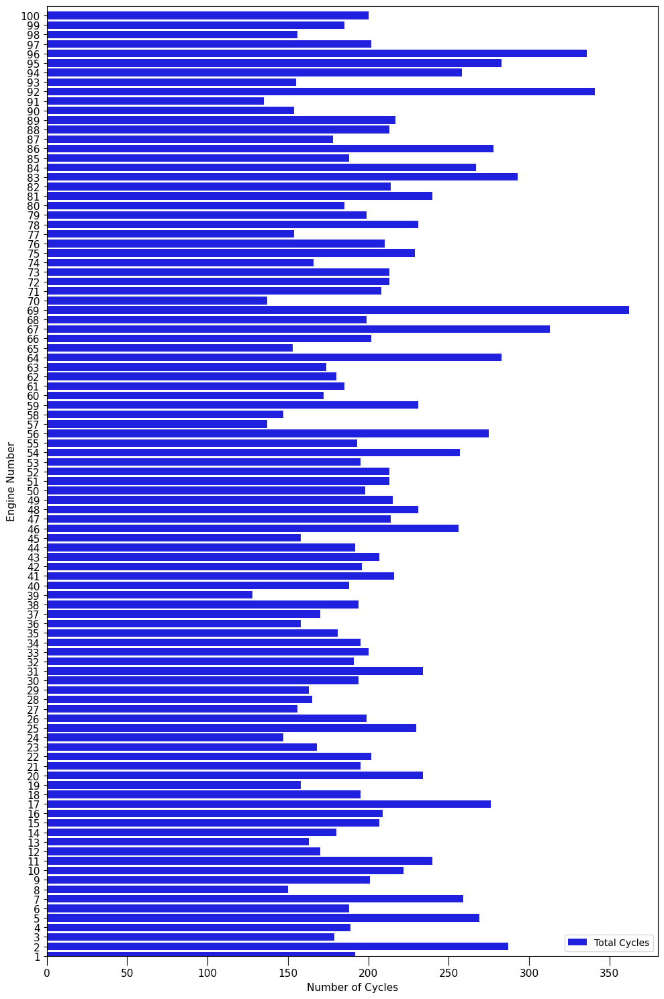

In [19]:
#create a bar graph to visualise number of cycles of each jet engine

# Create a subplot with a specified size
f, ax = plt.subplots(figsize=(10, 15))


# Create a horizontal bar plot
sns.barplot(x="cycle", y="Engine", data=jet_id_and_rul, label="Total Cycles", color="blue", orient='h')

# Add a legend to the plot
ax.legend(ncol=2, loc="lower right", frameon=True)

# Set limits for the y-axis
ax.set(ylim=(0, 100))


# Customize tick parameters
ax.tick_params(labelsize=11)
ax.tick_params(length=10, axis='x')

# Set labels for the y-axis and x-axis
ax.set_ylabel("Engine Number", fontsize=11)
ax.set_xlabel("Number of Cycles", fontsize=11)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

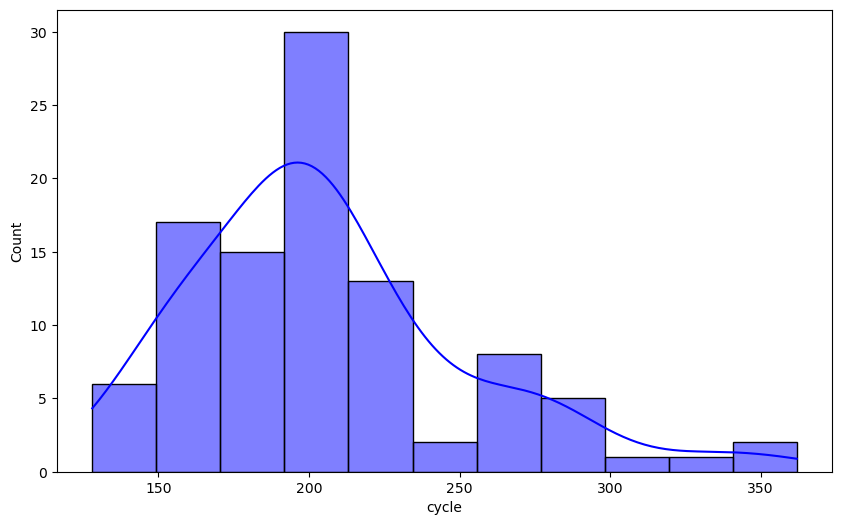

Mean number of cycles after which jet engine fails is 206.31


In [20]:
#to find the disribution of no of cycles after which jet engine fails
plt.figure(figsize=(10, 6))
sns.histplot(jet_id_and_rul["cycle"], kde = True, color='blue')
plt.show()
print("Mean number of cycles after which jet engine fails is", jet_id_and_rul["cycle"].mean())

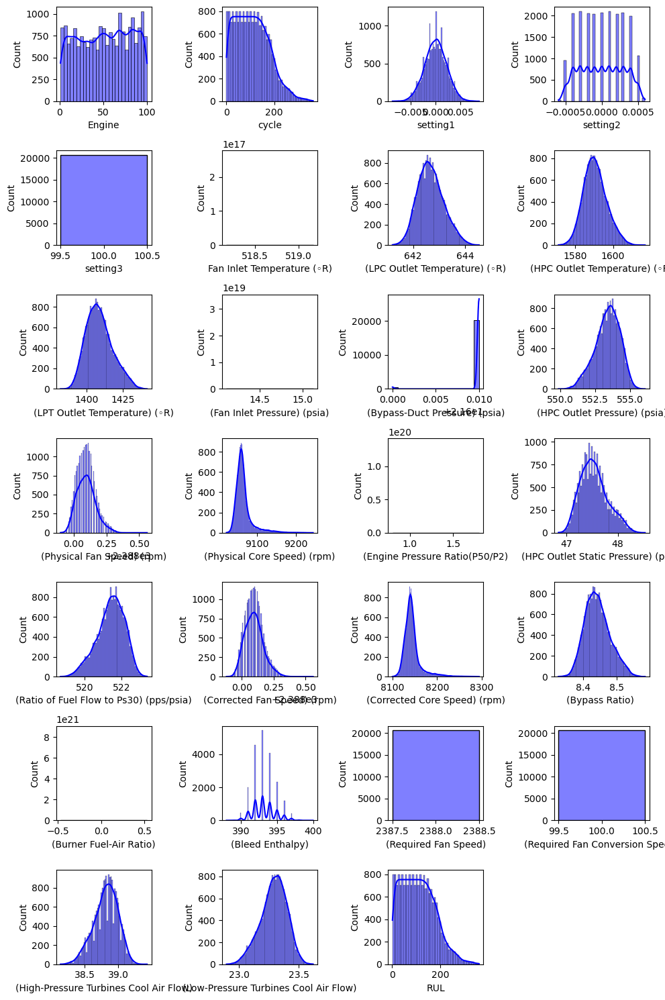

In [21]:
#create subplots to find data distribution of each sensor input
plt.figure(figsize=(10,15))
for i,v in enumerate(jet_data.columns):
    plt.subplot(7,4,i+1)
    sns.histplot(jet_data[v],kde=True,color='Blue')
plt.tight_layout()
plt.show()

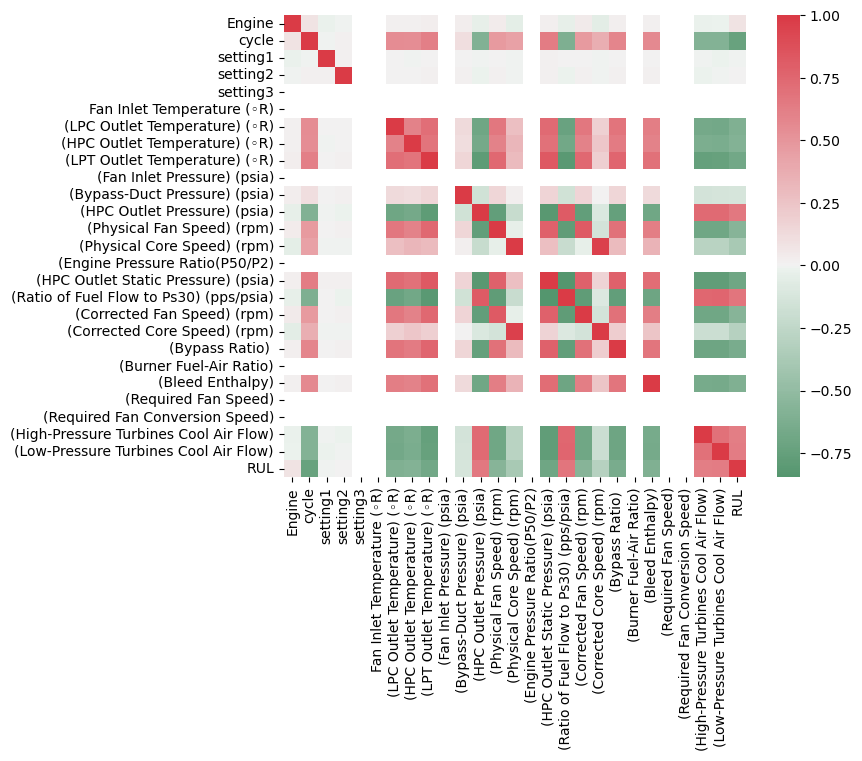

In [22]:
#lets find out correlation of all inputs with respect to RUL
plt.figure(figsize=(8,6))
cmap=sns.diverging_palette(500,10,as_cmap=True)
sns.heatmap(jet_data.corr(),cmap=cmap,center=0,square=True)
plt.show()

In [23]:
#dropping the above columns
jet_relevant_data=jet_data.drop(['cycle','setting1','setting2','setting3','Fan Inlet Temperature (◦R)','(Bypass-Duct Pressure) (psia)',
                                 '(Fan Inlet Pressure) (psia)','(Engine Pressure Ratio(P50/P2)','(Burner Fuel-Air Ratio)',
                                 '(Required Fan Speed)','(Required Fan Conversion Speed)'],axis=1)

In [24]:
jet_relevant_data.head()

,Engine,(LPC Outlet Temperature) (◦R),(HPC Outlet Temperature) (◦R),(LPT Outlet Temperature) (◦R),(HPC Outlet Pressure) (psia),(Physical Fan Speed) (rpm),(Physical Core Speed) (rpm),(HPC Outlet Static Pressure) (psia),(Ratio of Fuel Flow to Ps30) (pps/psia),(Corrected Fan Speed) (rpm),(Corrected Core Speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-Pressure Turbines Cool Air Flow),(Low-Pressure Turbines Cool Air Flow),RUL
0,1,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,192.0
1,1,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,191.0
2,1,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,190.0
3,1,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,189.0
4,1,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,188.0


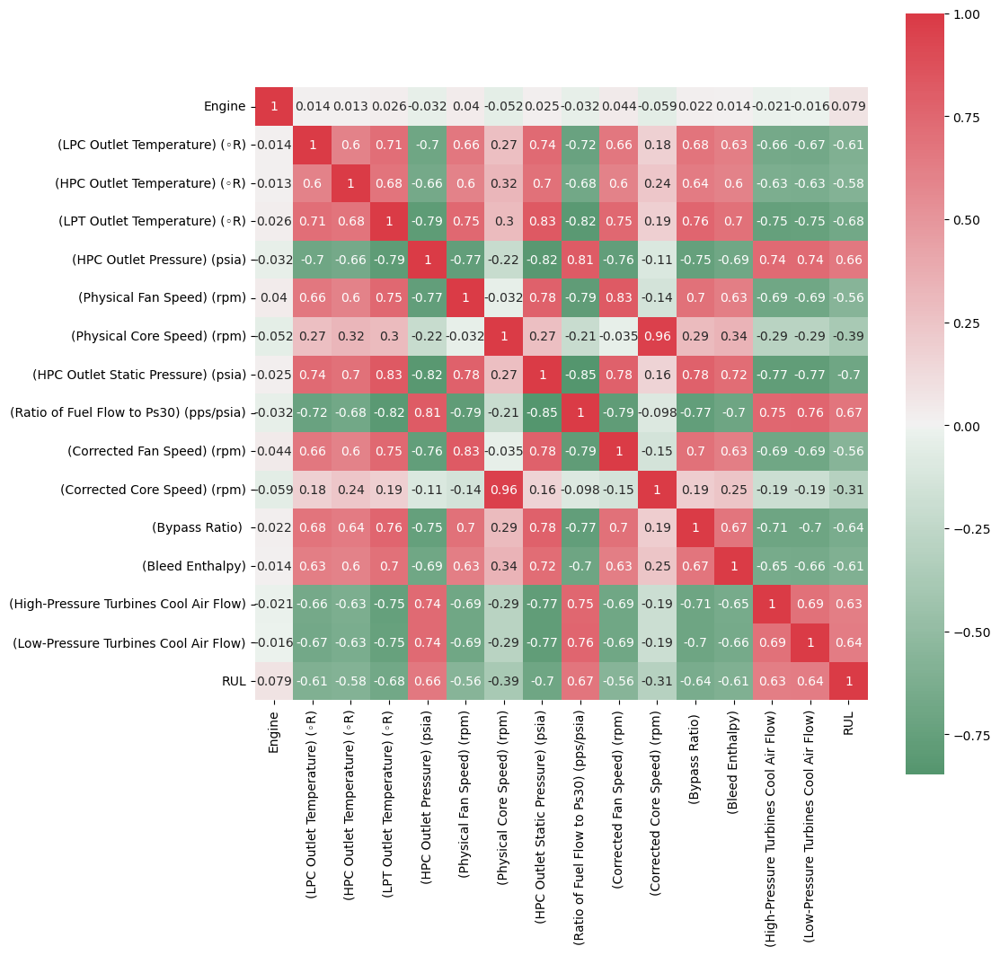

In [25]:
#rechecking corelation in jet_relevant_data'
plt.figure(figsize=(11,11))
cmap=(sns.diverging_palette(500,10,as_cmap=True))
sns.heatmap(jet_relevant_data.corr(),cmap=cmap,annot=True,center=0,square=True)
plt.show()

In [26]:
# plot sensor data wrt remaining usefull life
# creating function to plot individual sensor data 
def plot_sensor(sensor,X):
    plt.figure(figsize=(13, 5))
    
    for i in X['Engine'].unique():
        if i % 10 == 0:  # Plot every 10th engine
            plt.plot('RUL', sensor,data=X[X['Engine']==i].rolling(10).mean())

            # Add a vertical line at RUL = 30
            plt.axvline(30, color='red', linestyle='dashed', linewidth=2)

    # Reverse the x-axis so RUL counts down to zero
    plt.xlim(250, 0)

    # Set x-axis ticks
    plt.xticks(np.arange(0, 275, 25))

    # Set labels and title
    plt.ylabel(sensor)
    plt.xlabel('Remaining Useful Life')

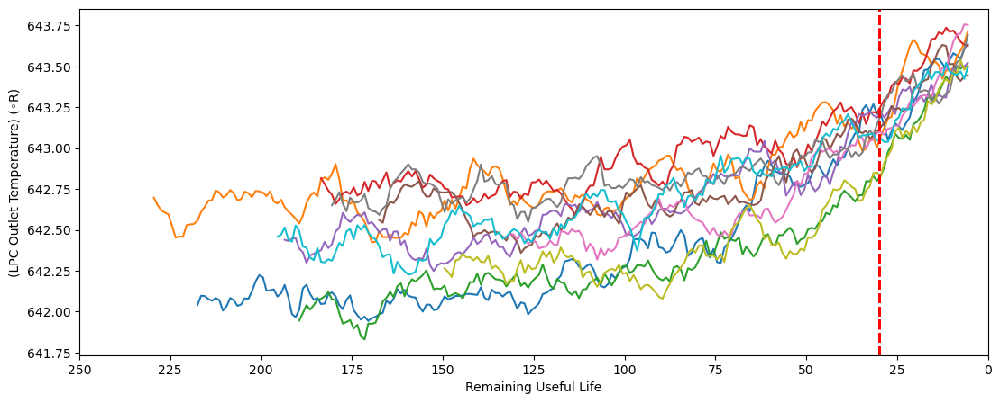

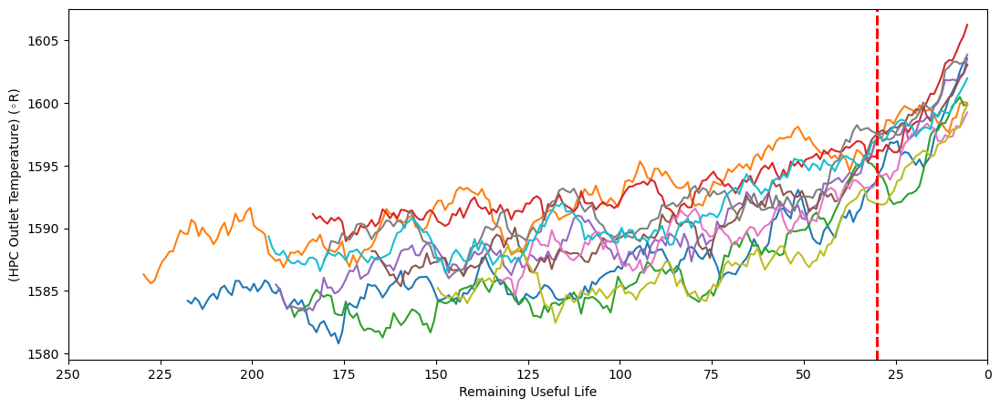

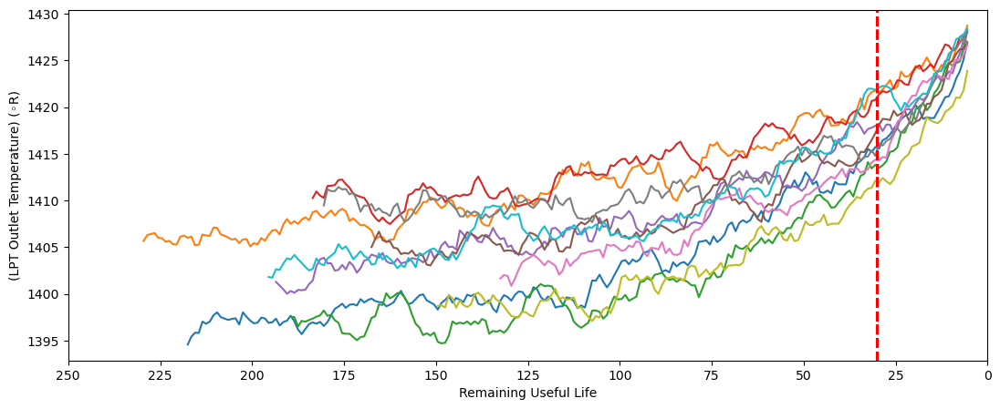

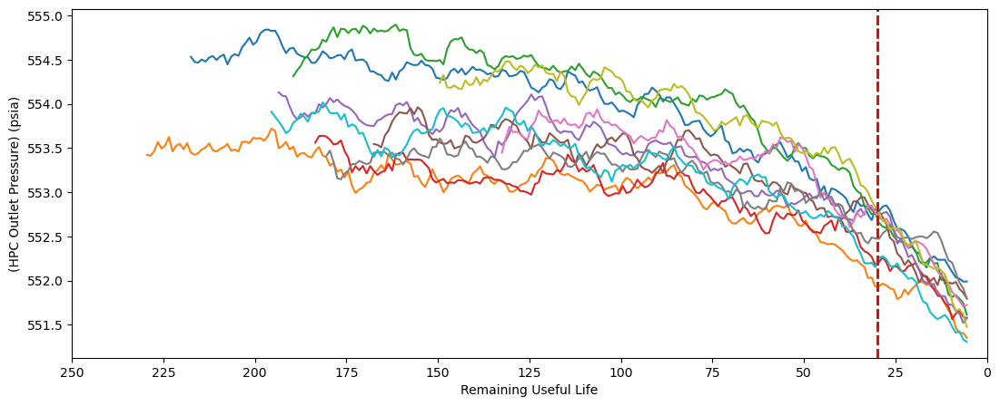

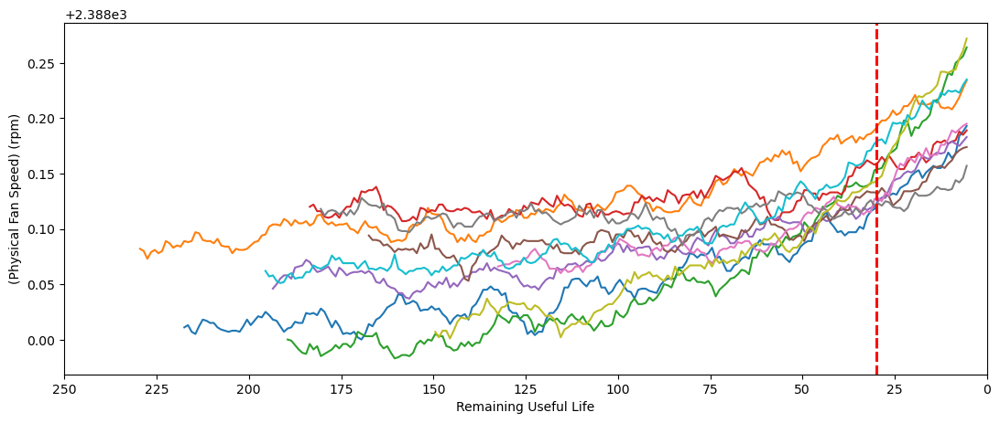

...

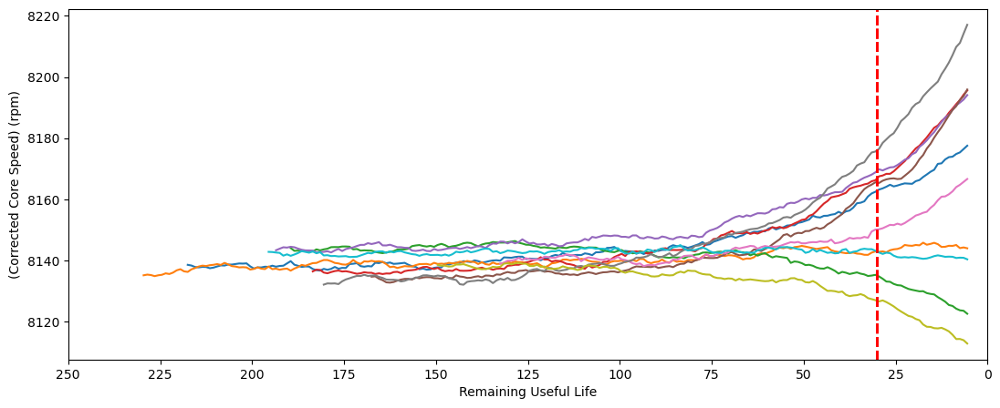

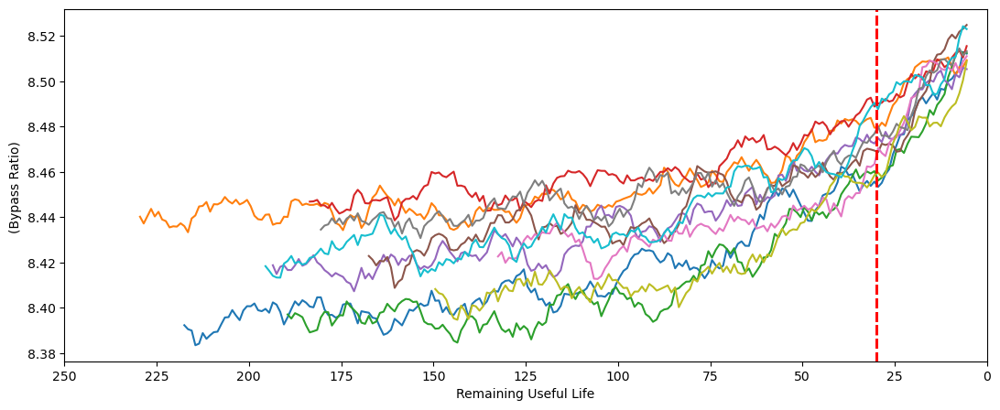

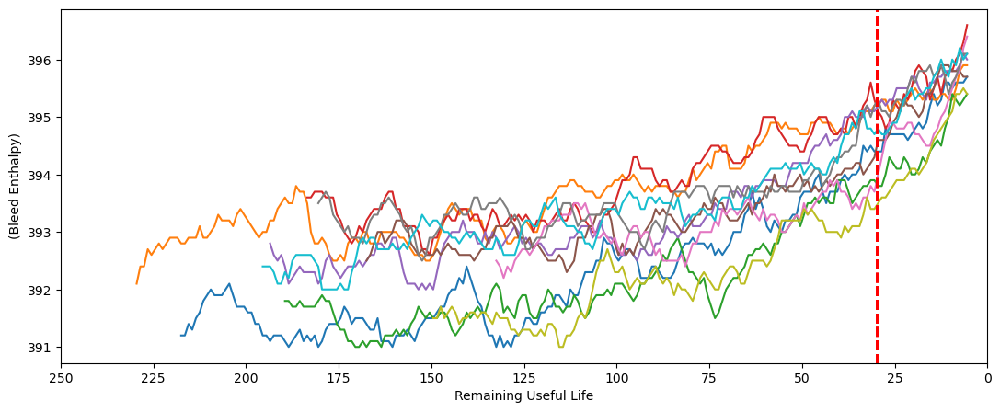

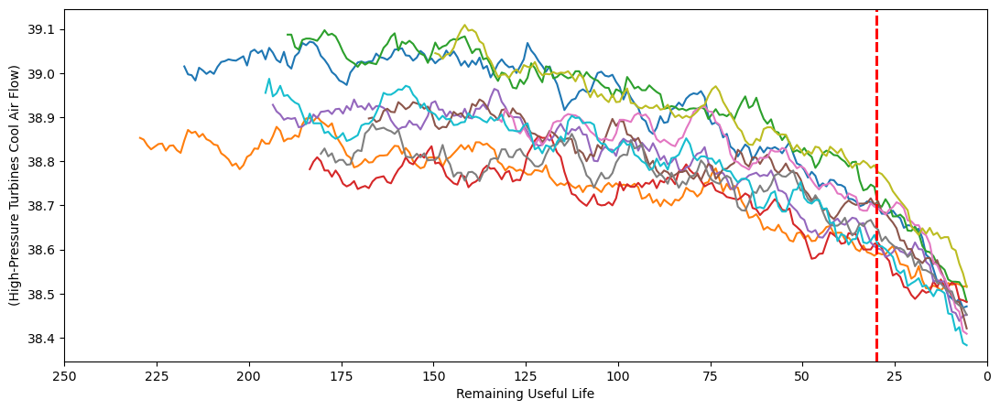

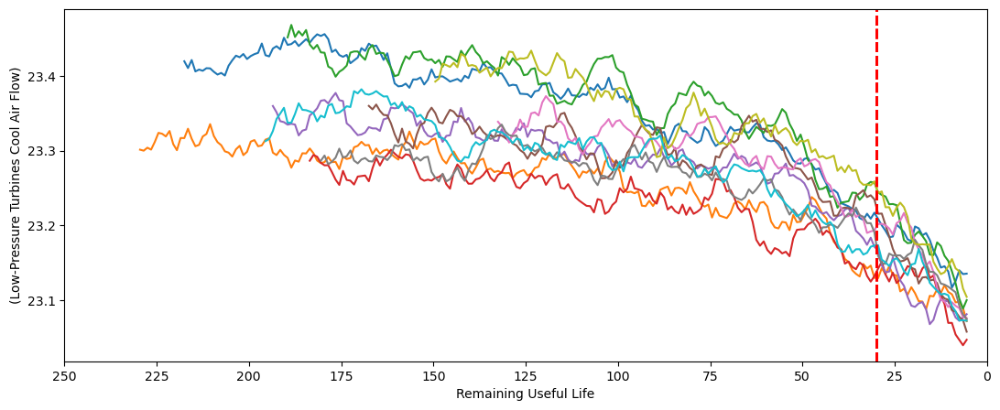

In [27]:
for sensor in jet_relevant_data.drop(['Engine', 'RUL'], axis=1).columns:
    plot_sensor(sensor, jet_relevant_data)

In [28]:
#from the above chart we can see that corrected core speed sensor behaves differently for different engines
jet_relevant_data.drop(['(Corrected Core Speed) (rpm)','(Physical Core Speed) (rpm)'],axis=1,inplace=True)

In [29]:
jet_relevant_data.head()

,Engine,(LPC Outlet Temperature) (◦R),(HPC Outlet Temperature) (◦R),(LPT Outlet Temperature) (◦R),(HPC Outlet Pressure) (psia),(Physical Fan Speed) (rpm),(HPC Outlet Static Pressure) (psia),(Ratio of Fuel Flow to Ps30) (pps/psia),(Corrected Fan Speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-Pressure Turbines Cool Air Flow),(Low-Pressure Turbines Cool Air Flow),RUL
0,1,641.82,1589.70,1400.60,554.36,2388.06,47.47,521.66,2388.02,8.4195,392,39.06,23.4190,192.0
1,1,642.15,1591.82,1403.14,553.75,2388.04,47.49,522.28,2388.07,8.4318,392,39.00,23.4236,191.0
2,1,642.35,1587.99,1404.20,554.26,2388.08,47.27,522.42,2388.03,8.4178,390,38.95,23.3442,190.0
3,1,642.35,1582.79,1401.87,554.45,2388.11,47.13,522.86,2388.08,8.3682,392,38.88,23.3739,189.0
4,1,642.37,1582.85,1406.22,554.00,2388.06,47.28,522.19,2388.04,8.4294,393,38.90,23.4044,188.0


In [30]:
jet_relevant_data.iloc[1].tolist()

[1.0,
 642.15,
 1591.82,
 1403.14,
 553.75,
 2388.04,
 47.49,
 522.28,
 2388.07,
 8.4318,
 392.0,
 39.0,
 23.4236,
 191.0]

In [31]:
jet_relevant_data.iloc[180].tolist()

[1.0,
 643.44,
 1596.71,
 1420.64,
 551.83,
 2388.23,
 48.1,
 520.43,
 2388.23,
 8.472,
 397.0,
 38.34,
 23.1652,
 12.0]

In [32]:
#importing scaler
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()

In [33]:
#applying scaler except on engine and RUL
scaled_data=ss.fit_transform(jet_relevant_data.drop(['Engine','RUL'],axis=1))
scaled_data = pd.DataFrame(scaled_data, columns=jet_relevant_data.drop(['Engine', 'RUL'], axis=1).columns)

In [34]:
scaled_data['Engine'] = jet_relevant_data['Engine']
scaled_data['RUL'] = jet_relevant_data['RUL']

In [35]:
scaled_data.head()

,(LPC Outlet Temperature) (◦R),(HPC Outlet Temperature) (◦R),(LPT Outlet Temperature) (◦R),(HPC Outlet Pressure) (psia),(Physical Fan Speed) (rpm),(HPC Outlet Static Pressure) (psia),(Ratio of Fuel Flow to Ps30) (pps/psia),(Corrected Fan Speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-Pressure Turbines Cool Air Flow),(Low-Pressure Turbines Cool Air Flow),Engine,RUL
0,-1.721725,-0.134255,-0.925936,1.121141,-0.516338,-0.266467,0.334262,-1.058890,-0.603816,-0.781710,1.348493,1.194427,1,192.0
1,-1.061780,0.211528,-0.643726,0.431930,-0.798093,-0.191583,1.174899,-0.363646,-0.275852,-0.781710,1.016528,1.236922,1,191.0
2,-0.661813,-0.413166,-0.525953,1.008155,-0.234584,-1.015303,1.364721,-0.919841,-0.649144,-2.073094,0.739891,0.503423,1,190.0
3,-0.661813,-1.261314,-0.784831,1.222827,0.188048,-1.539489,1.961302,-0.224597,-1.971665,-0.781710,0.352598,0.777792,1,189.0
4,-0.621816,-1.251528,-0.301518,0.714393,-0.516338,-0.977861,1.052871,-0.780793,-0.339845,-0.136018,0.463253,1.059552,1,188.0


In [36]:
# making a copy for model development
df=scaled_data.copy()

In [37]:
#Setting last 30 cycles as limit for failure prediction
cycle=30
#creating function for binary classification
RUL_T=lambda x:1 if x<=cycle else 0

In [38]:
df['label']=[np.nan]*df.shape[0]

In [39]:
for i in range(0,df.shape[0]):
    a=df.loc[i,'RUL']
    df.at[i,'label']=RUL_T(a)

In [40]:
df.head()

,(LPC Outlet Temperature) (◦R),(HPC Outlet Temperature) (◦R),(LPT Outlet Temperature) (◦R),(HPC Outlet Pressure) (psia),(Physical Fan Speed) (rpm),(HPC Outlet Static Pressure) (psia),(Ratio of Fuel Flow to Ps30) (pps/psia),(Corrected Fan Speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-Pressure Turbines Cool Air Flow),(Low-Pressure Turbines Cool Air Flow),Engine,RUL,label
0,-1.721725,-0.134255,-0.925936,1.121141,-0.516338,-0.266467,0.334262,-1.058890,-0.603816,-0.781710,1.348493,1.194427,1,192.0,0.0
1,-1.061780,0.211528,-0.643726,0.431930,-0.798093,-0.191583,1.174899,-0.363646,-0.275852,-0.781710,1.016528,1.236922,1,191.0,0.0
2,-0.661813,-0.413166,-0.525953,1.008155,-0.234584,-1.015303,1.364721,-0.919841,-0.649144,-2.073094,0.739891,0.503423,1,190.0,0.0
3,-0.661813,-1.261314,-0.784831,1.222827,0.188048,-1.539489,1.961302,-0.224597,-1.971665,-0.781710,0.352598,0.777792,1,189.0,0.0
4,-0.621816,-1.251528,-0.301518,0.714393,-0.516338,-0.977861,1.052871,-0.780793,-0.339845,-0.136018,0.463253,1.059552,1,188.0,0.0


In [41]:
df.tail(5)

,(LPC Outlet Temperature) (◦R),(HPC Outlet Temperature) (◦R),(LPT Outlet Temperature) (◦R),(HPC Outlet Pressure) (psia),(Physical Fan Speed) (rpm),(HPC Outlet Static Pressure) (psia),(Ratio of Fuel Flow to Ps30) (pps/psia),(Corrected Fan Speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-Pressure Turbines Cool Air Flow),(Low-Pressure Turbines Cool Air Flow),Engine,RUL,label
20626,1.618000,1.216258,2.188375,-2.189329,1.315066,1.980044,-2.607969,2.278282,1.425294,2.446751,-1.805173,-2.921113,100,5.0,1.0
20627,1.717992,2.279706,2.738351,-2.833345,1.878576,1.867718,-2.350355,1.722087,1.913240,1.155367,-2.856395,-1.203764,100,4.0,1.0
20628,1.478011,1.946971,2.138377,-2.742957,2.019453,2.054927,-1.902919,2.000184,3.265092,3.092444,-2.081810,-3.292481,100,3.0,1.0
20629,1.098043,2.403666,1.955051,-3.036719,2.160330,3.178182,-2.363913,1.861136,2.579834,1.155367,-2.911722,-2.085072,100,2.0,1.0
20630,2.337940,1.607712,2.578358,-2.912435,2.301208,2.466787,-2.865584,2.278282,1.638604,1.801059,-2.469103,-2.194080,100,1.0,1.0


In [42]:
df.iloc[1].tolist()

[-1.0617797067522012,
 0.2115284938758204,
 -0.6437258660491735,
 0.431930175249528,
 -0.7980929993508061,
 -0.19158292532444912,
 1.1748993222074802,
 -0.36364599790254193,
 -0.27585181070180737,
 -0.7817097857218288,
 1.0165279304068096,
 1.2369219607271347,
 1.0,
 191.0,
 0.0]

In [43]:
df.columns

Index(['(LPC Outlet Temperature) (◦R)', '(HPC Outlet Temperature) (◦R)', '(LPT Outlet Temperature) (◦R)', '(HPC Outlet Pressure) (psia)', '(Physical Fan Speed) (rpm)', '(HPC Outlet Static Pressure) (psia)', '(Ratio of Fuel Flow to Ps30) (pps/psia)', '(Corrected Fan Speed) (rpm)', '(Bypass Ratio) ', '(Bleed Enthalpy)', '(High-Pressure Turbines Cool Air Flow)', '(Low-Pressure Turbines Cool Air Flow)', 'Engine', 'RUL', 'label'], dtype='object')

<Figure size 1300x2000 with 0 Axes>

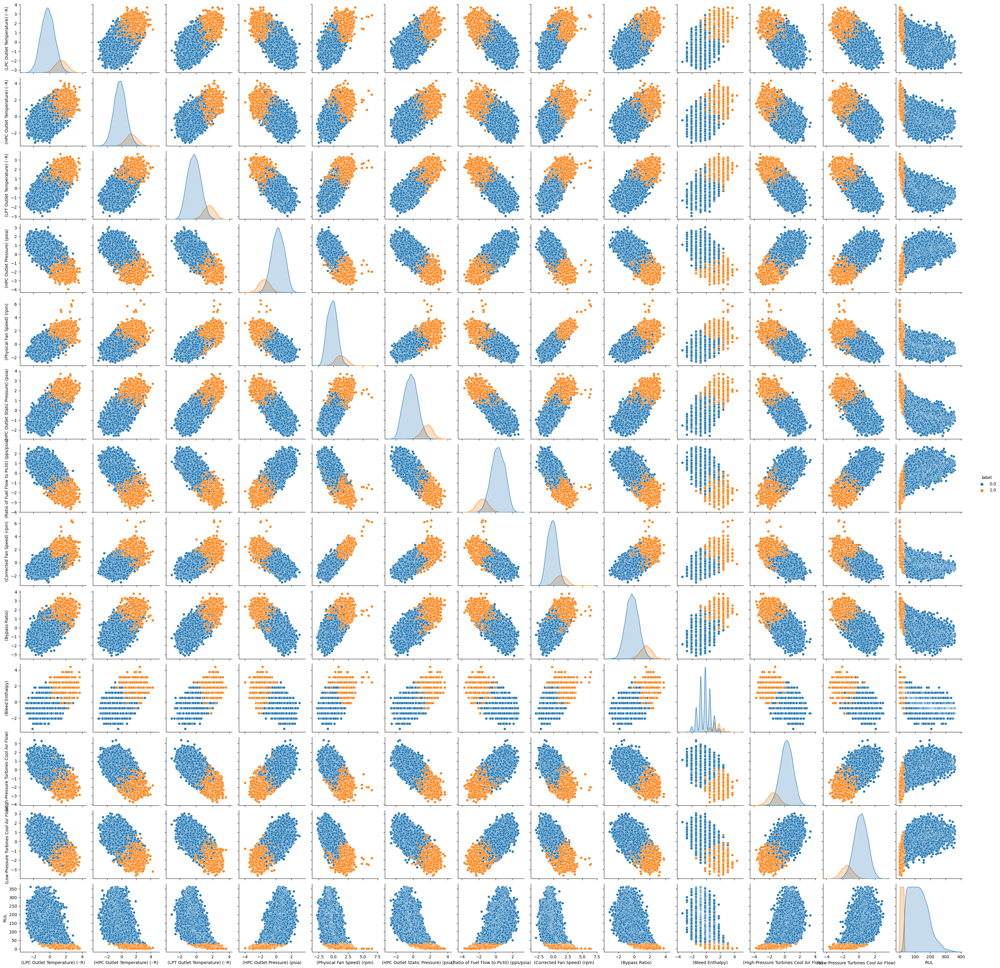

In [44]:
#to understand the distribution of safe and unsafe data points
plt.figure(figsize=(13,20))
sns.pairplot(df.drop(['Engine'], axis=1), hue="label")
plt.show()

In [45]:
#preparing inputs and outputs for model
X=df.drop(['Engine','RUL','label'],axis=1)
Y=df['label']

In [46]:
X.head()

,(LPC Outlet Temperature) (◦R),(HPC Outlet Temperature) (◦R),(LPT Outlet Temperature) (◦R),(HPC Outlet Pressure) (psia),(Physical Fan Speed) (rpm),(HPC Outlet Static Pressure) (psia),(Ratio of Fuel Flow to Ps30) (pps/psia),(Corrected Fan Speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-Pressure Turbines Cool Air Flow),(Low-Pressure Turbines Cool Air Flow)
0,-1.721725,-0.134255,-0.925936,1.121141,-0.516338,-0.266467,0.334262,-1.058890,-0.603816,-0.781710,1.348493,1.194427
1,-1.061780,0.211528,-0.643726,0.431930,-0.798093,-0.191583,1.174899,-0.363646,-0.275852,-0.781710,1.016528,1.236922
2,-0.661813,-0.413166,-0.525953,1.008155,-0.234584,-1.015303,1.364721,-0.919841,-0.649144,-2.073094,0.739891,0.503423
3,-0.661813,-1.261314,-0.784831,1.222827,0.188048,-1.539489,1.961302,-0.224597,-1.971665,-0.781710,0.352598,0.777792
4,-0.621816,-1.251528,-0.301518,0.714393,-0.516338,-0.977861,1.052871,-0.780793,-0.339845,-0.136018,0.463253,1.059552


In [47]:
Y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: label, dtype: float64

In [48]:
#train test split 
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=1)

In [49]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(16504, 12)
(4127, 12)
(16504,)
(4127,)


Model Building

We will try building model with following algorithms and select best model out of them
1) Logistic_regression
2) Support vector classifier
3) random forest classifier
4) decision tree

In [50]:
#Importing model training algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

In [51]:
classifiers={"Logisitic Regression": LogisticRegression(),
    "Support Vector Classifier": SVC(kernel="poly"),
    'Random Forest Classifier':RandomForestClassifier(max_features=1),
             "Decision tree":DecisionTreeClassifier()
            }

In [52]:
#lets find out which model has best training score
for model_name,model in classifiers.items():
    model.fit(X_train,Y_train)
    training_score=cross_val_score(model,X_train,Y_train,cv=5)
    print(model_name,'has a training score of',round(training_score.mean(),2)*100,'% accuracy score')

Logisitic Regression has a training score of 96.0 % accuracy score
Support Vector Classifier has a training score of 96.0 % accuracy score
Random Forest Classifier has a training score of 95.0 % accuracy score
Decision tree has a training score of 93.0 % accuracy score


In [53]:
#lets find best parameters for each model

#1) Logistic Regression
log_reg_params = {"penalty": ['l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
grid_log_reg=GridSearchCV(LogisticRegression(),log_reg_params,cv=5)
grid_log_reg.fit(X_train, Y_train)
print(grid_log_reg.best_params_)

{'C': 1, 'penalty': 'l2'}


In [54]:
# 2) SVC 
svc_params = {'C': [0.5, 0.7, 0.9, 1], 'kernel': ['rbf', 'poly', 'sigmoid', 'linear']}
grid_svc = GridSearchCV(SVC(), svc_params,cv=5)
grid_svc.fit(X_train, Y_train)
print(grid_svc.best_params_)

{'C': 0.5, 'kernel': 'poly'}


In [55]:
# 3) Random Forest Classifier
RFC_parms={'max_features':list(range(1, 18))}
grid_RFC = GridSearchCV(RandomForestClassifier(),RFC_parms,cv=5)
grid_RFC.fit(X_train,Y_train)
print(grid_RFC.best_params_)

{'max_features': 3}


In [56]:
# 4) Decision Tree Classifier
tree_params = {"criterion": ["gini", "entropy"], "max_depth": list(range(2,4,1)), 
              "min_samples_leaf": list(range(5,7,1))}
grid_tree = GridSearchCV(DecisionTreeClassifier(), tree_params,cv=5)
grid_tree.fit(X_train,Y_train)
print(grid_tree.best_params_)

{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 5}


In [57]:
#setting the model with above parameters
lr=LogisticRegression(C= 1, penalty = 'l2')
svc=SVC(random_state=1,C=0.5,kernel='poly')
rfc=RandomForestClassifier(random_state=1,max_features= 16)
dtc=DecisionTreeClassifier(random_state=1,criterion='gini',max_depth=3, min_samples_leaf=5)

In [58]:
from sklearn.metrics import classification_report,confusion_matrix

In [59]:
#create a function to test model
def create_model(model):
    model.fit(X_train,Y_train)
    print('Training accuracy',round(model.score(X_train,Y_train),3)*100)
    Y_pred=model.predict(X_test)
    print(classification_report(Y_test,Y_pred))
    print(confusion_matrix(Y_test,Y_pred))

In [60]:
# check testing score of logarithmic regression
create_model(lr)

Training accuracy 95.6
              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97      3512
         1.0       0.84      0.81      0.82       615

    accuracy                           0.95      4127
   macro avg       0.90      0.89      0.90      4127
weighted avg       0.95      0.95      0.95      4127

[[3418   94]
 [ 118  497]]


In [61]:
#check testing score of support vector mechanism
create_model(svc)

Training accuracy 95.8
              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97      3512
         1.0       0.87      0.77      0.82       615

    accuracy                           0.95      4127
   macro avg       0.91      0.88      0.89      4127
weighted avg       0.95      0.95      0.95      4127

[[3438   74]
 [ 139  476]]


In [62]:
#check testing score of random forest classifier
create_model(rfc)

Training accuracy 100.0
              precision    recall  f1-score   support

         0.0       0.96      0.97      0.97      3512
         1.0       0.85      0.79      0.82       615

    accuracy                           0.95      4127
   macro avg       0.90      0.88      0.89      4127
weighted avg       0.95      0.95      0.95      4127

[[3424   88]
 [ 130  485]]


In [63]:
#check testing score of decision tree classifier
create_model(dtc)

Training accuracy 94.69999999999999
              precision    recall  f1-score   support

         0.0       0.96      0.97      0.96      3512
         1.0       0.80      0.76      0.78       615

    accuracy                           0.94      4127
   macro avg       0.88      0.86      0.87      4127
weighted avg       0.93      0.94      0.94      4127

[[3397  115]
 [ 150  465]]


# We get a recall score of 81% with logistic regression. Precison and recall score is less for label 1 (i.e preventive maintenence required) and is good for 0 (i.e preventive maintenence not required). lets find the count of both labels

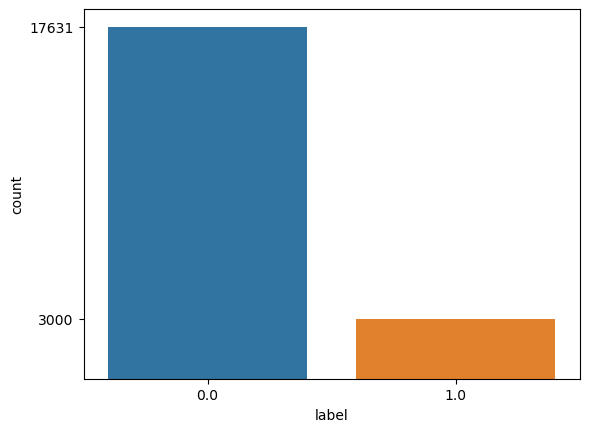

In [64]:
#How many samples of 0th and 1 class
f=df['label'].value_counts()
sns.countplot(data=df,x='label')
plt.yticks(f)
plt.show()

In [65]:
Y_train.value_counts()

0.0    14119
1.0     2385
Name: label, dtype: int64

In [66]:
# we see that there is huge imbalance in count of label 0 and 1. Hence we balance with random over sampler.

In [67]:
from imblearn.over_sampling import RandomOverSampler

In [68]:
#create object of RandomOverSampler class
ros=RandomOverSampler(random_state=1)
#fit_resample() inbuilt method of RandomOverSample class
X_train_ros,Y_train_ros=ros.fit_resample(X_train,Y_train)

In [69]:
#check balance or not
Y_train_ros.value_counts()

0.0    14119
1.0    14119
Name: label, dtype: int64

In [70]:
X_train_ros.shape,X_train.shape

((28238, 12), (16504, 12))

In [71]:
#similar process on testing data
#check on testing data
Y_test.value_counts()

0.0    3512
1.0     615
Name: label, dtype: int64

In [72]:
#Apply random over sampler to testing data
X_test_ros,Y_test_ros=ros.fit_resample(X_test,Y_test)

In [73]:
#check balances or not
Y_test_ros.value_counts()

0.0    3512
1.0    3512
Name: label, dtype: int64

In [74]:
#lets find best parameters for each model

#1) Logistic Regression
log_reg_params = {"penalty": ['l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
grid_log_reg_ros=GridSearchCV(LogisticRegression(),log_reg_params,cv=5)
grid_log_reg_ros.fit(X_train_ros, Y_train_ros)
print(grid_log_reg_ros.best_params_)

{'C': 0.01, 'penalty': 'l2'}


In [75]:
# 2) SVC 
svc_params = {'C': [0.5, 0.7, 0.9, 1], 'kernel': ['rbf', 'poly', 'sigmoid', 'linear']}
grid_svc_ros = GridSearchCV(SVC(), svc_params,cv=5)
grid_svc_ros.fit(X_train_ros, Y_train_ros)
print(grid_svc_ros.best_params_)

{'C': 1, 'kernel': 'rbf'}


In [76]:
# 3) Random Forest Classifier
RFC_parms={'max_features':list(range(1, 18))}
grid_RFC_ros = GridSearchCV(RandomForestClassifier(),RFC_parms,cv=5)
grid_RFC_ros.fit(X_train_ros,Y_train_ros)
print(grid_RFC_ros.best_params_)

{'max_features': 2}


In [77]:
# 4) Decision Tree Classifier
tree_params = {"criterion": ["gini", "entropy"], "max_depth": list(range(2,4,1)), 
              "min_samples_leaf": list(range(5,7,1))}
grid_tree_ros = GridSearchCV(DecisionTreeClassifier(), tree_params,cv=5)
grid_tree_ros.fit(X_train_ros,Y_train_ros)
print(grid_tree_ros.best_params_)

{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 5}


In [78]:
#setting the model with above parameters
lr=LogisticRegression(C= 1.0, penalty = 'l2')
svc=SVC(random_state=1,C=1,kernel='rbf')
rfc=RandomForestClassifier(random_state=1,max_features= 1)
dtc=DecisionTreeClassifier(random_state=1,criterion='gini',max_depth=3, min_samples_leaf=5)

In [79]:
#create a function to test model
def create_model(model):
    model.fit(X_train_ros,Y_train_ros)
    print('Training accuracy',round(model.score(X_train_ros,Y_train_ros),3)*100)
    #print('Testing accuracy',round(model.score(X_train,Y_train),3)*100)
    Y_pred=model.predict(X_test_ros)
    print(classification_report(Y_test_ros,Y_pred))
    print(confusion_matrix(Y_test_ros,Y_pred))

In [80]:
# check testing score of logistic regression
create_model(lr)

Training accuracy 93.7
              precision    recall  f1-score   support

         0.0       0.94      0.92      0.93      3512
         1.0       0.93      0.95      0.94      3512

    accuracy                           0.93      7024
   macro avg       0.94      0.93      0.93      7024
weighted avg       0.94      0.93      0.93      7024

[[3244  268]
 [ 190 3322]]


In [81]:
# check testing score of support vectore classifier
create_model(svc)

Training accuracy 94.3
              precision    recall  f1-score   support

         0.0       0.96      0.91      0.94      3512
         1.0       0.92      0.96      0.94      3512

    accuracy                           0.94      7024
   macro avg       0.94      0.94      0.94      7024
weighted avg       0.94      0.94      0.94      7024

[[3213  299]
 [ 124 3388]]


In [82]:
#check testing score of random forest classifier
create_model(rfc)

Training accuracy 100.0
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.91      3512
         1.0       0.96      0.85      0.90      3512

    accuracy                           0.91      7024
   macro avg       0.91      0.91      0.91      7024
weighted avg       0.91      0.91      0.91      7024

[[3393  119]
 [ 517 2995]]


In [83]:
#check testing score of decision tree classifier
create_model(dtc)

Training accuracy 92.7
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91      3512
         1.0       0.91      0.91      0.91      3512

    accuracy                           0.91      7024
   macro avg       0.91      0.91      0.91      7024
weighted avg       0.91      0.91      0.91      7024

[[3187  325]
 [ 317 3195]]


# This time we find the best recall score of 96% with support vector classifier.

In [84]:
#to store object of model and object of standard scaler class but in binary format
import pickle

In [85]:
#exporting standard scaler file
file1=open("scale.pkl",'wb')
#syntax pickle.dump(object, temp file)
pickle.dump(ss,file1)
file1.close()

#exporting model file 
file2=open('supportvectorclassifier.pkl','wb')
pickle.dump(svc,file2)
file2.close()